In [1]:
import sys
sys.path.append("../")

In [2]:
from src.models.models import get_clip_model, get_image_embeddings, get_text_embeddings
from src.dataset.dataset import CustomDataset
from src.evaluation.evaluation import get_dataset, calculate_hit_rate_at_k, calculate_mrr

/Users/dmitriimaksimov/Desktop/GitHub/Qdrant_task/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
dataset = get_dataset('../results/eval_openai.jsonl')

In [6]:
mrr = 0
hit_rate_at_5 = 0
dataset.values()

dict_values([{'mrr': 0.08333333333333333, 'hr@k': 0}, {'mrr': 0.5, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 0.5, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 0.07142857142857142, 'hr@k': 0}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 0.0125, 'hr@k': 0}, {'mrr': 0.25, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 0.16666666666666666, 'hr@k': 0}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 0.02857142857142857, 'hr@k': 0}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 0.05, 'hr@k': 0}, {'mrr': 0.010416666666666666, 'hr@k': 0}, {'mrr': 0.02127659574468085, 'hr@k': 0}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 0.010752688172043012, 'hr@k': 0}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 1.0, 'hr@k': 1}, {'mrr': 0.5, 'hr@k

In [3]:
from omegaconf import OmegaConf
params = OmegaConf.load('../configs/evaluation_config.yaml')

In [4]:
model, tokenizer, transforms, device = get_clip_model(params)

In [5]:
images = CustomDataset(f'../{params.image_directory}', transforms)
image_embeddings = get_image_embeddings(params, model, device, images)

/Users/dmitriimaksimov/Desktop/GitHub/Qdrant_task/.venv/lib/python3.10/site-packages/torch/amp/autocast_mode.py:250: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
100%|██████████| 348/348 [04:23<00:00,  1.32it/s]


In [6]:
dataset = get_dataset(f'../{params.dataset}')

In [7]:
import numpy as np
text_embeddings = get_text_embeddings(model, tokenizer, device, dataset)
similarity = np.matmul(text_embeddings, image_embeddings.T)
relevant_indices = [images.image2idx[f'../{image}'] for image in dataset.keys()]
mrr = calculate_mrr(similarity, relevant_indices)
hit_rate_at_k = calculate_hit_rate_at_k(similarity, relevant_indices, params.top_k)

100%|██████████| 100/100 [00:02<00:00, 40.81it/s]


In [8]:
examples = np.argsort(mrr)

In [9]:
import matplotlib.pyplot as plt
from PIL import Image


def plot_samples(samples):
    for i in samples:
        f, ax = plt.subplots(1, 5, figsize=(25, 7))
        text = list(dataset.values())[i]
        f.suptitle(text, fontsize=16)
        with Image.open(f'../{list(dataset.keys())[i]}') as im:
            ax[0].imshow(im)
            ax[0].set_title('expected')
        top_k_images = similarity[i].argsort()[-4:][::-1]
        for j in range(len(top_k_images)):
            with Image.open(images.images[top_k_images[j]]) as im:
                ax[j + 1].imshow(im)
                ax[j + 1].set_title(f'predicted: #{j + 1}')

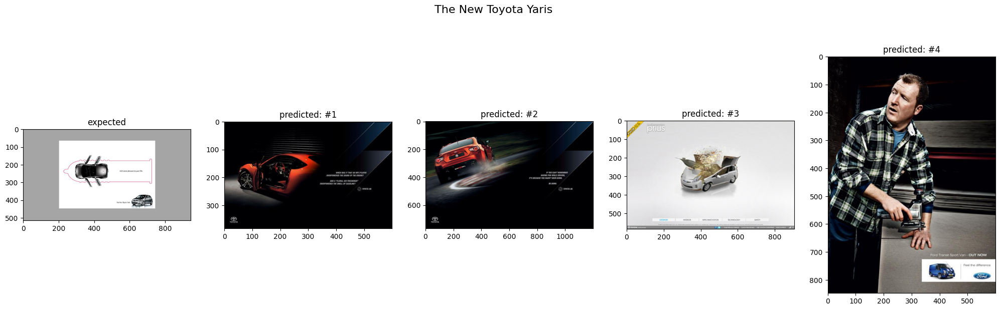

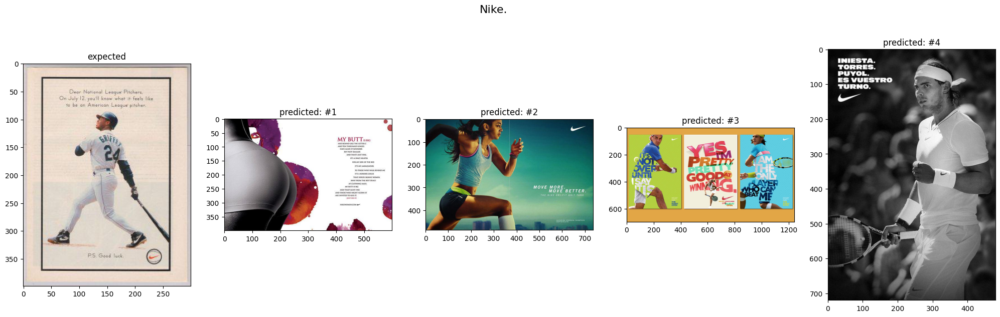

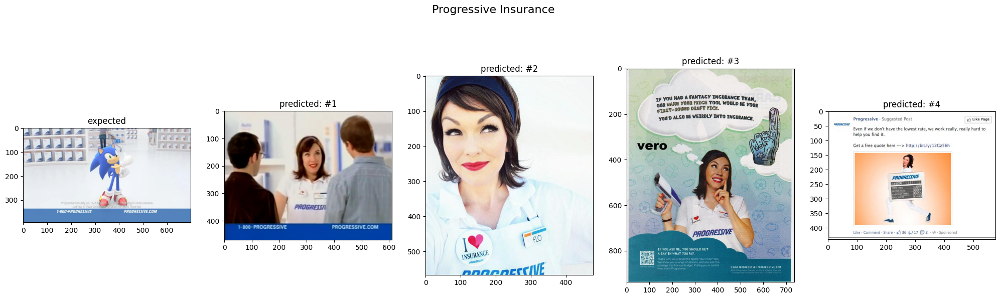

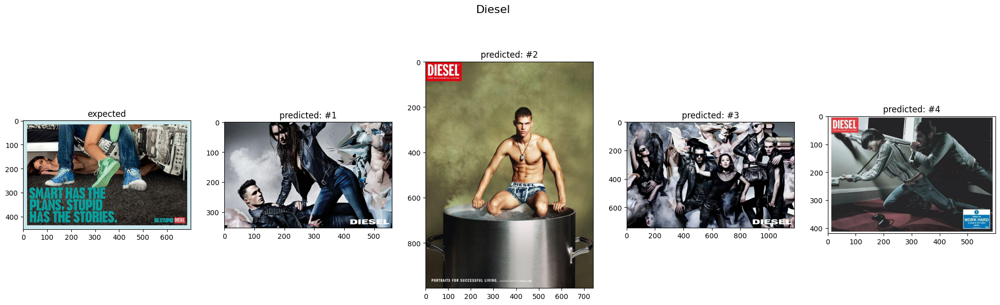

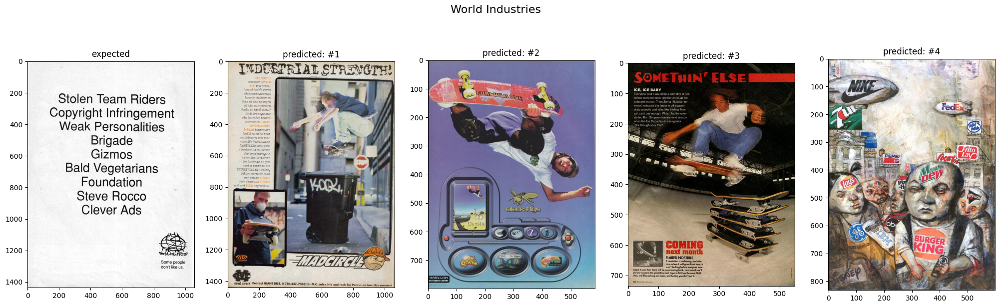

In [10]:
plot_samples(examples[:5])

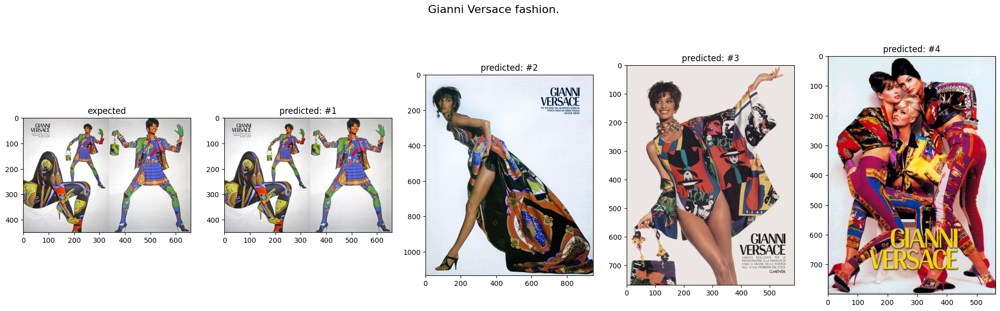

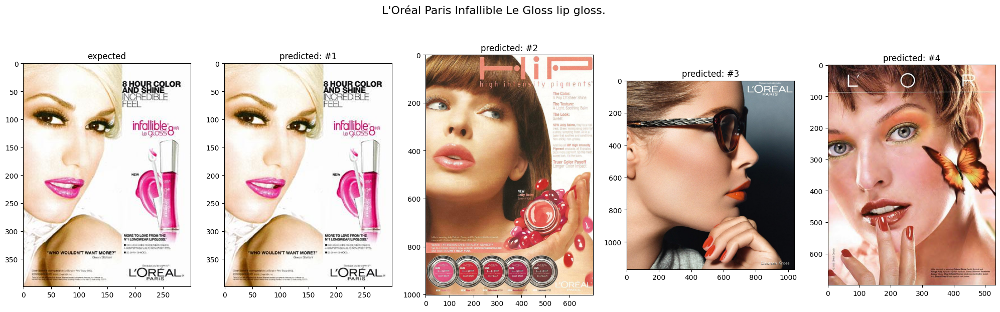

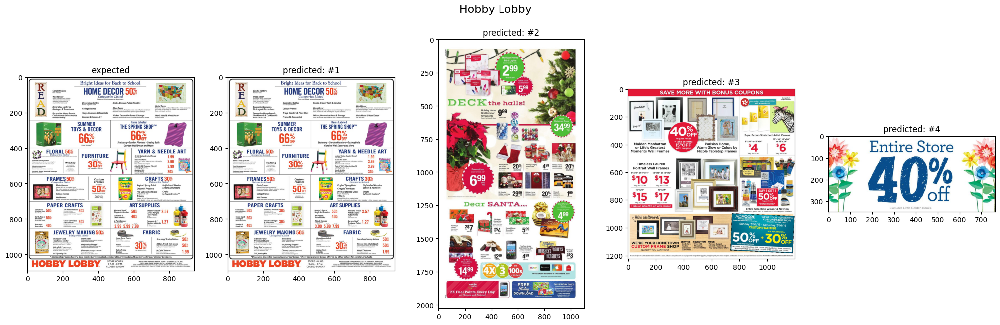

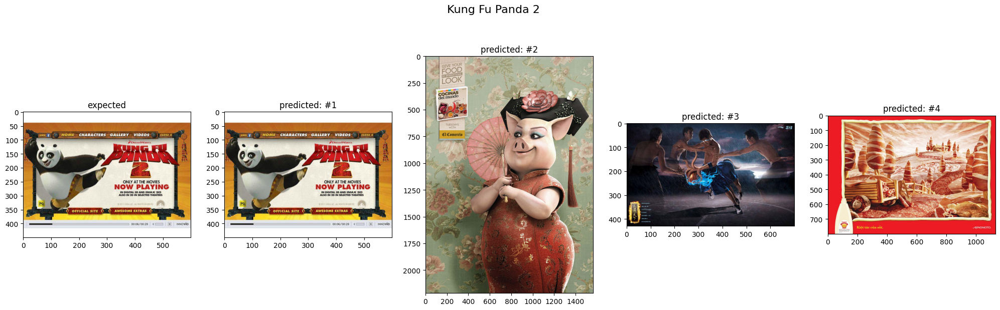

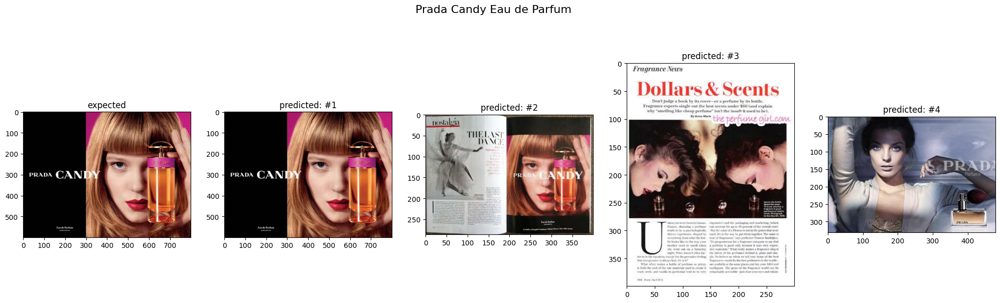

In [11]:
plot_samples(examples[-5:])